In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/curated-cxr-report-generation-dataset/NLP_aug_datasets/df_train_aug.csv
/kaggle/input/curated-cxr-report-generation-dataset/NLP_aug_datasets/T5_paired_CXR_val.tfrecord
/kaggle/input/curated-cxr-report-generation-dataset/NLP_aug_datasets/df_val_aug.csv
/kaggle/input/curated-cxr-report-generation-dataset/NLP_aug_datasets/T5_aug_CXR_train.tfrecord
/kaggle/input/curated-cxr-report-generation-dataset/MedViLL-master/MedViLL-master/LICENSE
/kaggle/input/curated-cxr-report-generation-dataset/MedViLL-master/MedViLL-master/.gitignore
/kaggle/input/curated-cxr-report-generation-dataset/MedViLL-master/MedViLL-master/main.py
/kaggle/input/curated-cxr-report-generation-dataset/MedViLL-master/MedViLL-master/README.md
/kaggle/input/curated-cxr-report-generation-dataset/MedViLL-master/MedViLL-master/requirements.txt
/kaggle/input/curated-cxr-report-generation-dataset/MedViLL-master/MedViLL-master/medvill.yaml
/kaggle/input/curated-cxr-report-generation-dataset/MedViLL-master/MedViLL-maste

In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("financekim/curated-cxr-report-generation-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/curated-cxr-report-generation-dataset


In [3]:
# 📦 Step 1: Import libraries
import pandas as pd
import numpy as np
import re
import nltk
import os

from sklearn.model_selection import train_test_split
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# NLTK downloads (only run once)
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()


[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [4]:
# 📂 Step 2: Load CSV Files
train_path = "/kaggle/input/curated-cxr-report-generation-dataset/Cleanses csv tfrecords/df_train.csv"
val_path = "/kaggle/input/curated-cxr-report-generation-dataset/Cleanses csv tfrecords/df_val.csv"

df_train = pd.read_csv(train_path)
df_val = pd.read_csv(val_path)

# Combine train and val for full preprocessing
df = pd.concat([df_train, df_val], ignore_index=True)

print("Shape:", df.shape)
df.head()


Shape: (95232, 3)


,id,text,path
0,s50260386,A tip of a left Port-A-Cath lies in the low su...,../input/curated-cxr-report-generation-dataset...
1,s58019009,"AP chest compared to ___, 9:04 a.m.: In place ...",../input/curated-cxr-report-generation-dataset...
2,s54123565,"AP chest compared to ___, read in conjunction ...",../input/curated-cxr-report-generation-dataset...
3,s51811896,A tracheostomy cannula is located within the u...,../input/curated-cxr-report-generation-dataset...
4,s59641633,Bilateral previous mentioned reticular opaciti...,../input/curated-cxr-report-generation-dataset...


In [5]:
# 🧹 Step 3: Clean Text Function
def clean_text(text):
    text = str(text).lower()
    text = re.sub(r'\n', ' ', text)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    tokens = nltk.word_tokenize(text)
    tokens = [lemmatizer.lemmatize(w) for w in tokens if w not in stop_words]
    return ' '.join(tokens)


In [6]:
# ✅ Step 4: Apply Cleaning on `impression` Column
# Check which column exists: 'impression' or 'Report_Impression'?
df.columns


Index(['id', 'text', 'path'], dtype='object')

In [7]:

df['clean_impression'] = df['text'].apply(clean_text)


In [8]:
# 🏷️ Step 5: Define Disease Keywords
disease_keywords = {
    'pneumonia': ['pneumonia', 'consolidation'],
    'cardiomegaly': ['cardiomegaly', 'enlarged heart'],
    'pleural_effusion': ['effusion', 'pleural fluid'],
    'atelectasis': ['atelectasis'],
    'edema': ['edema'],
    'infiltration': ['infiltrate', 'infiltration'],
    'nodule': ['nodule', 'mass', 'lesion'],
    'opacity': ['opacity']
}


In [9]:
# 🧠 Step 6: Create Labels from Keywords
def extract_labels(text, keyword_dict):
    labels = {}
    for disease, terms in keyword_dict.items():
        found = any(term in text for term in terms)
        labels[disease] = int(found)
    return pd.Series(labels)

label_df = df['clean_impression'].apply(lambda x: extract_labels(x, disease_keywords))
df = pd.concat([df, label_df], axis=1)


In [10]:
# 📊 Step 7: Check Label Distribution
print("Label distribution:\n", df[list(disease_keywords.keys())].sum())


Label distribution:
 pneumonia           33283
cardiomegaly        15758
pleural_effusion    66704
atelectasis         32993
edema               30870
infiltration         2227
nodule               3846
opacity             26334
dtype: int64


In [11]:
# 📦 Step 8: Train-Test Split
X = df['clean_impression']
y = df[list(disease_keywords.keys())]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

print("Training samples:", len(X_train))


Training samples: 76185


In [12]:
!pip install transformers==4.41.2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.8/43.8 kB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 69.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 86.5 MB/s eta 0:00:00
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.21.2
    Uninstalling tokenizers-0.21.2:
      Successfully uninstalled tokenizers-0.21.2
  Attempting uninstall: transformers
    Found existing installation: transformers 4.52.4
    Uninstalling transformers-4.52.4:
      Successfully uninstalled transformers-4.52.4


In [13]:
import pandas as pd
import torch
from transformers import AutoTokenizer, AutoModel, BertModel, BertTokenizerFast
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import classification_report


In [14]:
# Already cleaned using previous preprocessing steps
X = df['clean_impression']
y = df[list(disease_keywords.keys())]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

labels = y.columns.tolist()


In [15]:
model_name = "emilyalsentzer/Bio_ClinicalBERT"
tokenizer = AutoTokenizer.from_pretrained(model_name)
bert = AutoModel.from_pretrained(model_name)


/usr/local/lib/python3.11/dist-packages/huggingface_hub/file_download.py:943: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/385 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/436M [00:00<?, ?B/s]

In [16]:
class ReportDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=128):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts.iloc[idx]
        label = self.labels.iloc[idx].values.astype(float)
        encoding = self.tokenizer(text,
                                  truncation=True,
                                  padding='max_length',
                                  max_length=self.max_len,
                                  return_tensors="pt")
        return {
            'input_ids': encoding['input_ids'].squeeze(),
            'attention_mask': encoding['attention_mask'].squeeze(),
            'labels': torch.tensor(label, dtype=torch.float)
        }


In [17]:
train_dataset = ReportDataset(X_train, y_train, tokenizer)
test_dataset = ReportDataset(X_test, y_test, tokenizer)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16)


In [18]:
class BERTClassifier(nn.Module):
    def __init__(self, bert, num_labels):
        super(BERTClassifier, self).__init__()
        self.bert = bert
        self.dropout = nn.Dropout(0.3)
        self.classifier = nn.Linear(bert.config.hidden_size, num_labels)

    def forward(self, input_ids, attention_mask):
        outputs = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        cls_output = outputs.last_hidden_state[:, 0, :]  # [CLS] token
        cls_output = self.dropout(cls_output)
        return torch.sigmoid(self.classifier(cls_output))


In [19]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = BERTClassifier(bert, num_labels=len(labels)).to(device)

optimizer = optim.Adam(model.parameters(), lr=2e-5)
loss_fn = nn.BCELoss()


In [20]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import numpy as np
from sklearn.metrics import classification_report, multilabel_confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns


In [21]:
train_dataset = ReportDataset(X_train, y_train, tokenizer)
test_dataset = ReportDataset(X_test, y_test, tokenizer)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)


In [22]:
num_epochs = 15
threshold = 0.5  # Sigmoid threshold for multi-label
optimizer = optim.Adam(model.parameters(), lr=2e-5)
loss_fn = nn.BCELoss()
train_losses = []
val_losses = []
labels_list = y.columns.tolist()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [23]:
for epoch in range(num_epochs):
    # ----- Training -----
    model.train()
    total_train_loss = 0
    for batch in train_loader:
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels_batch = batch['labels'].to(device)

        optimizer.zero_grad()
        outputs = model(input_ids, attention_mask)
        loss = loss_fn(outputs, labels_batch)
        loss.backward()
        optimizer.step()
        total_train_loss += loss.item()
    
    avg_train_loss = total_train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # ----- Validation -----
    model.eval()
    total_val_loss = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for batch in test_loader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels_batch = batch['labels'].to(device)

            outputs = model(input_ids, attention_mask)
            loss = loss_fn(outputs, labels_batch)
            total_val_loss += loss.item()

            preds = (outputs > threshold).int().cpu().numpy()
            all_preds.append(preds)
            all_labels.append(labels_batch.cpu().numpy())

    avg_val_loss = total_val_loss / len(test_loader)
    val_losses.append(avg_val_loss)

    all_preds = np.vstack(all_preds)
    all_labels = np.vstack(all_labels)

    # Multi-label accuracy
    accuracy = (all_preds == all_labels).mean()

    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f} | Accuracy: {accuracy:.4f}")


Epoch 1/15
Train Loss: 0.0238 | Val Loss: 0.0026 | Accuracy: 0.9997
Epoch 2/15
Train Loss: 0.0026 | Val Loss: 0.0039 | Accuracy: 0.9989
Epoch 3/15
Train Loss: 0.0017 | Val Loss: 0.0015 | Accuracy: 0.9996
Epoch 4/15
Train Loss: 0.0014 | Val Loss: 0.0015 | Accuracy: 0.9996
Epoch 5/15
Train Loss: 0.0012 | Val Loss: 0.0016 | Accuracy: 0.9996
Epoch 6/15
Train Loss: 0.0010 | Val Loss: 0.0019 | Accuracy: 0.9996
Epoch 7/15
Train Loss: 0.0010 | Val Loss: 0.0016 | Accuracy: 0.9996
Epoch 8/15
Train Loss: 0.0007 | Val Loss: 0.0021 | Accuracy: 0.9997
Epoch 9/15
Train Loss: 0.0007 | Val Loss: 0.0025 | Accuracy: 0.9997
Epoch 10/15
Train Loss: 0.0006 | Val Loss: 0.0017 | Accuracy: 0.9995
Epoch 11/15
Train Loss: 0.0005 | Val Loss: 0.0020 | Accuracy: 0.9997
Epoch 12/15
Train Loss: 0.0004 | Val Loss: 0.0025 | Accuracy: 0.9997
Epoch 13/15
Train Loss: 0.0005 | Val Loss: 0.0017 | Accuracy: 0.9996
Epoch 14/15
Train Loss: 0.0004 | Val Loss: 0.0019 | Accuracy: 0.9997
Epoch 15/15
Train Loss: 0.0004 | Val Loss: 

In [24]:
torch.save(model.state_dict(), "clinicalbert_cxr_model.pth")
print("Model saved successfully!")


Model saved successfully!


In [25]:
print("\n=== Classification Report ===")
print(classification_report(all_labels, all_preds, target_names=labels_list, zero_division=0))



=== Classification Report ===
                  precision    recall  f1-score   support

       pneumonia       1.00      1.00      1.00      6661
    cardiomegaly       1.00      1.00      1.00      3152
pleural_effusion       1.00      1.00      1.00     13386
     atelectasis       1.00      1.00      1.00      6637
           edema       0.99      1.00      1.00      6139
    infiltration       1.00      1.00      1.00       441
          nodule       1.00      1.00      1.00       743
         opacity       1.00      1.00      1.00      5240

       micro avg       1.00      1.00      1.00     42399
       macro avg       1.00      1.00      1.00     42399
    weighted avg       1.00      1.00      1.00     42399
     samples avg       0.89      0.89      0.89     42399



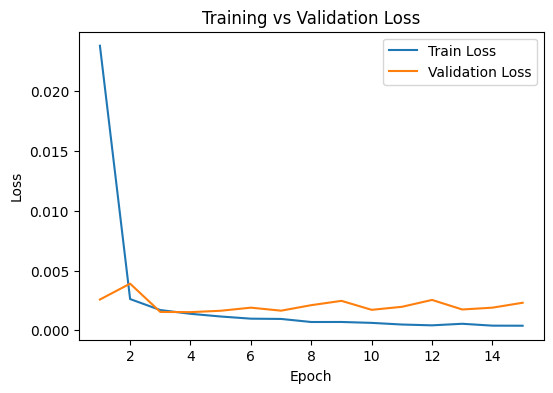

In [26]:
plt.figure(figsize=(6,4))
plt.plot(range(1, num_epochs+1), train_losses, label='Train Loss')
plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.show()



Confusion matrix for pneumonia:
[[12382     4]
 [    9  6652]]


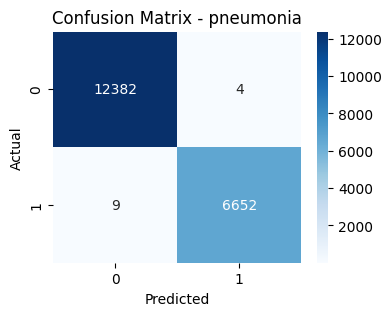


Confusion matrix for cardiomegaly:
[[15893     2]
 [    1  3151]]


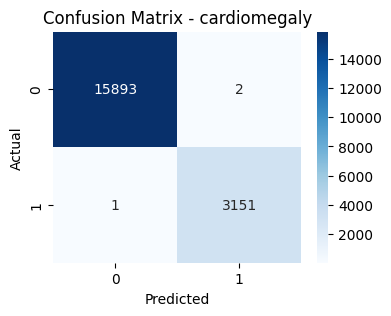


Confusion matrix for pleural_effusion:
[[ 5653     8]
 [    3 13383]]


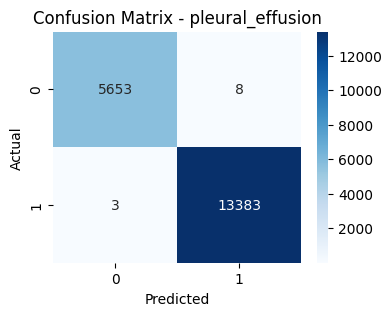


Confusion matrix for atelectasis:
[[12385    25]
 [    0  6637]]


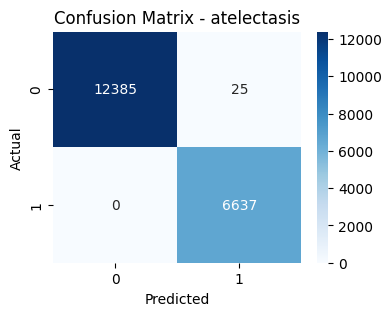


Confusion matrix for edema:
[[12869    39]
 [    1  6138]]


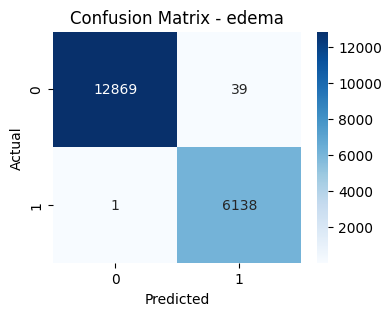


Confusion matrix for infiltration:
[[18605     1]
 [    1   440]]


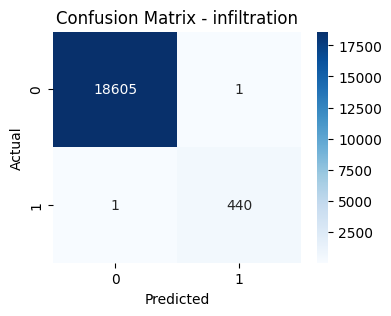


Confusion matrix for nodule:
[[18304     0]
 [    1   742]]


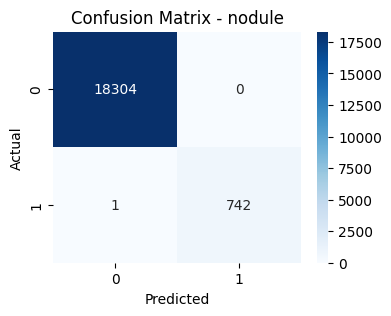


Confusion matrix for opacity:
[[13804     3]
 [    7  5233]]


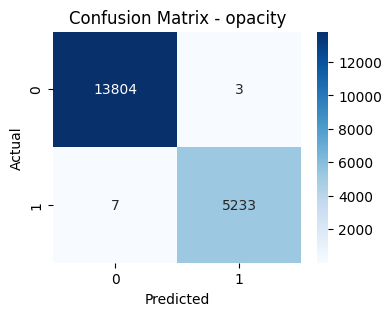

In [27]:
mcm = multilabel_confusion_matrix(all_labels, all_preds)

for i, label in enumerate(labels_list):
    tn, fp, fn, tp = mcm[i].ravel()
    print(f"\nConfusion matrix for {label}:")
    print(mcm[i])

    plt.figure(figsize=(4,3))
    sns.heatmap(mcm[i], annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix - {label}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()
